# Project Risk Prediction - ML Experiment

**Author:** Nada Ramadan  
**Dataset:** Project Management Risk Dataset (Kaggle)  
**Objective:** Predict project risk levels (Low, Medium, High, Critical)

---

## 1. Import Libraries

In [ ]:
# Data manipulation and analysis
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# File and system operations
import os
import joblib

# Machine Learning - Preprocessing
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV

# Machine Learning - Models
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Handling imbalanced data
from imblearn.over_sampling import SMOTE

# Advanced models
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

print("All libraries imported successfully!")

## 2. Load Dataset

In [ ]:
# Load the dataset
data = pd.read_csv('../data/project_risk_raw_dataset.csv')
print(f"Dataset loaded: {data.shape[0]} rows, {data.shape[1]} columns")

In [ ]:
# Display first few rows
data.head(10)

## 3. Exploratory Data Analysis (EDA)

In [ ]:
data.shape

(4000, 50)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 50 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Project_Type                     4000 non-null   object 
 1   Team_Size                        4000 non-null   int64  
 2   Project_Budget_USD               4000 non-null   float64
 3   Estimated_Timeline_Months        4000 non-null   int64  
 4   Complexity_Score                 4000 non-null   float64
 5   Stakeholder_Count                4000 non-null   int64  
 6   Methodology_Used                 4000 non-null   object 
 7   Team_Experience_Level            4000 non-null   object 
 8   Past_Similar_Projects            4000 non-null   int64  
 9   External_Dependencies_Count      4000 non-null   int64  
 10  Change_Request_Frequency         4000 non-null   float64
 11  Project_Phase                    4000 non-null   object 
 12  Requirement_Stabilit

In [ ]:
data.describe()

,Team_Size,Project_Budget_USD,Estimated_Timeline_Months,Complexity_Score,Stakeholder_Count,Past_Similar_Projects,External_Dependencies_Count,Change_Request_Frequency,Team_Turnover_Rate,Vendor_Reliability_Score,...,Market_Volatility,Integration_Complexity,Resource_Availability,Organizational_Change_Frequency,Cross_Functional_Dependencies,Previous_Delivery_Success_Rate,Technical_Debt_Level,Project_Start_Month,Current_Phase_Duration_Months,Seasonal_Risk_Factor
count,4000.000000,4.000000e+03,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,...,4000.00000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.00000,4000.000000,4000.000000,4000.000000
mean,15.388250,1.143032e+06,17.147750,6.192525,11.130500,1.973750,3.127750,1.638080,0.292725,0.712087,...,0.49716,5.573585,0.651695,1.212215,3.549250,0.750437,0.17544,6.492500,4.074500,1.011325
std,9.220969,5.908781e+05,6.926609,2.212538,4.425875,1.750093,1.609216,1.170451,0.166546,0.163418,...,0.28702,2.606654,0.201163,0.969191,2.320004,0.143712,0.29682,3.476416,2.883926,0.031694
min,2.000000,1.593555e+05,2.000000,1.620000,2.000000,0.000000,0.000000,0.010000,0.000000,0.090000,...,0.00000,1.000000,0.300000,0.000000,0.000000,0.150000,0.00000,1.000000,1.000000,1.000000
25%,9.000000,6.925329e+05,12.000000,4.460000,8.000000,1.000000,2.000000,0.760000,0.160000,0.600000,...,0.25000,3.317500,0.480000,0.500000,2.000000,0.660000,0.00000,4.000000,2.000000,1.000000
50%,13.000000,1.007472e+06,17.000000,6.015000,10.000000,2.000000,3.000000,1.370000,0.270000,0.730000,...,0.50000,5.600000,0.650000,0.960000,4.000000,0.770000,0.00000,7.000000,3.000000,1.000000
75%,20.000000,1.475870e+06,22.000000,7.862500,14.000000,3.000000,4.000000,2.230000,0.400000,0.840000,...,0.74000,7.860000,0.820000,1.660000,6.000000,0.860000,0.28000,10.000000,6.000000,1.000000
max,50.000000,3.768354e+06,36.000000,10.000000,29.000000,10.000000,7.000000,8.840000,0.850000,1.000000,...,1.00000,10.000000,1.000000,8.230000,7.000000,0.990000,1.00000,12.000000,17.000000,1.100000


## 4. Data Preprocessing

Handle missing values, drop unnecessary columns, and prepare data for modeling.

In [ ]:
data.isnull().sum()

,0
Project_Type,0
Team_Size,0
Project_Budget_USD,0
Estimated_Timeline_Months,0
Complexity_Score,0
Stakeholder_Count,0
Methodology_Used,0
Team_Experience_Level,0
Past_Similar_Projects,0
External_Dependencies_Count,0


In [ ]:
data.drop('Project_ID', axis=1, inplace=True)

In [ ]:
# Drop 'Tech_Environment_Stability' column if it exists
if 'Tech_Environment_Stability' in data.columns:
    data.drop('Tech_Environment_Stability', axis=1, inplace=True)

# Impute missing values in 'Change_Control_Maturity' and 'Risk_Management_Maturity' with 'Unknown'
data['Change_Control_Maturity'] = data['Change_Control_Maturity'].fillna('Unknown')
data['Risk_Management_Maturity'] = data['Risk_Management_Maturity'].fillna('Unknown')

print("Missing values after cleaning:")
print(data[['Change_Control_Maturity', 'Risk_Management_Maturity']].isnull().sum())

Missing values after cleaning:
Change_Control_Maturity     0
Risk_Management_Maturity    0
dtype: int64


In [ ]:
# Separate features and target
X = data.drop('Risk_Level', axis=1)
y = data['Risk_Level']

print(f"Features shape: {X.shape}")
print(f"Target shape: {y.shape}")

## 5. Feature Engineering

Create new features to capture important relationships and interactions.

In [ ]:
X['Budget_per_TeamMember'] = data['Project_Budget_USD'] / data['Team_Size']
X['Timeline_per_TeamMember'] = data['Estimated_Timeline_Months'] / data['Team_Size']
X['Risk_Index'] = (
    data['Historical_Risk_Incidents'] +
    data['Change_Request_Frequency'] +
    data['Team_Turnover_Rate']
)
X['Dependency_Load'] = (
    data['External_Dependencies_Count'] +
    data['Cross_Functional_Dependencies']
)
# Update numerical features list after adding engineered ones
num_features = X.select_dtypes(include=['int64','float64']).columns.tolist()

In [44]:
# Focused interaction features from top 15 important features

# 1. Complexity × Team Turnover
X['Complexity_Turnover'] = X['Complexity_Score'] * X['Team_Turnover_Rate']

# 2. Complexity × Timeline
X['Complexity_Timeline'] = X['Complexity_Score'] * X['Estimated_Timeline_Months']

# 3. Budget ÷ Timeline
X['Budget_Timeline_Ratio'] = X['Project_Budget_USD'] / (X['Estimated_Timeline_Months'] + 1e-6)

# 4. Budget ÷ Team Member
X['Budget_TeamMember_Ratio'] = X['Project_Budget_USD'] / (X['Budget_per_TeamMember'] + 1e-6)

# 5. Timeline ÷ Team Member
X['Timeline_TeamMember_Ratio'] = X['Estimated_Timeline_Months'] / (X['Timeline_per_TeamMember'] + 1e-6)

# 6. Dependencies × Timeline
X['Dependencies_Timeline'] = X['External_Dependencies_Count'] * X['Estimated_Timeline_Months']

# 7. Communication × Change Requests
X['Comm_Change_Interaction'] = X['Communication_Frequency'] * X['Change_Request_Frequency']

# 8. Market Volatility × Integration Complexity
X['Market_Integration'] = X['Market_Volatility'] * X['Integration_Complexity']

# 9. Resource Availability ÷ Organizational Change
X['Resource_Change_Ratio'] = X['Resource_Availability'] / (X['Organizational_Change_Frequency'] + 1e-6)

# 10. Previous Delivery Success × Complexity
X['Success_Complexity'] = X['Previous_Delivery_Success_Rate'] * X['Complexity_Score']

# 11. Budget Utilization × Budget
X['Budget_Utilization_Impact'] = X['Budget_Utilization_Rate'] * X['Project_Budget_USD']

# 12. Timeline ÷ Change Requests
X['Timeline_Change_Ratio'] = X['Estimated_Timeline_Months'] / (X['Change_Request_Frequency'] + 1e-6)

# 13. Team Turnover ÷ Resource Availability
X['Turnover_Resource_Ratio'] = X['Team_Turnover_Rate'] / (X['Resource_Availability'] + 1e-6)

# 14. Dependencies ÷ Communication
X['Dependencies_Comm_Ratio'] = X['External_Dependencies_Count'] / (X['Communication_Frequency'] + 1e-6)

# 15. Timeline ÷ Market Volatility
X['Timeline_Market_Ratio'] = X['Estimated_Timeline_Months'] / (X['Market_Volatility'] + 1e-6)


## 6. Train/Test Split

Separate features and target, then split into training and testing sets.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import joblib

from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [ ]:
X['Budget_per_TeamMember'] = data['Project_Budget_USD'] / data['Team_Size']
X['Timeline_per_TeamMember'] = data['Estimated_Timeline_Months'] / data['Team_Size']
X['Risk_Index'] = (
    data['Historical_Risk_Incidents'] +
    data['Change_Request_Frequency'] +
    data['Team_Turnover_Rate']
)
X['Dependency_Load'] = (
    data['External_Dependencies_Count'] +
    data['Cross_Functional_Dependencies']
)
# Update numerical features list after adding engineered ones
num_features = X.select_dtypes(include=['int64','float64']).columns.tolist()

In [ ]:
from sklearn.model_selection import train_test_split

X = data.drop(columns=['Risk_Level'])
y = data['Risk_Level']


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f"Training set size: {X_train.shape}")
print(f"Testing set size: {X_test.shape}")

Training set size: (3200, 49)
Testing set size: (800, 49)


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# Apply preprocessing to X to get transformed features
X_transformed = preprocessor.fit_transform(X)

X_resampled, y_resampled = SMOTE(random_state=42).fit_resample(
    X_transformed,
    y
)

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)
print("Random Forest with SMOTE:\n", classification_report(y_test, y_pred_rf))


Random Forest with SMOTE:
               precision    recall  f1-score   support

    Critical       0.87      0.82      0.84       301
        High       0.63      0.65      0.64       250
         Low       0.84      0.84      0.84       275
      Medium       0.64      0.66      0.65       291

    accuracy                           0.74      1117
   macro avg       0.74      0.74      0.74      1117
weighted avg       0.75      0.74      0.75      1117



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Use engineered + scaled + encoded features directly (no PCA)
X_features = preprocessor.fit_transform(X)  # preprocessor from earlier steps
y_target = y

# Apply SMOTE for balance
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_features, y_target)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Random Forest with tuned parameters
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("Random Forest (with SMOTE):\n", classification_report(y_test, y_pred))


Random Forest (no PCA, with SMOTE):
               precision    recall  f1-score   support

    Critical       0.86      0.81      0.83       301
        High       0.61      0.61      0.61       250
         Low       0.85      0.83      0.84       275
      Medium       0.61      0.66      0.63       291

    accuracy                           0.73      1117
   macro avg       0.73      0.73      0.73      1117
weighted avg       0.74      0.73      0.73      1117



In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Apply SMOTE using the preprocessed X_transformed data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_transformed, y)

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Encode target labels to numerical values
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

xgb = XGBClassifier(
    n_estimators=500,
    learning_rate=0.1,
    max_depth=12,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

    Critical       0.94      0.88      0.91       301
        High       0.69      0.73      0.71       250
         Low       0.86      0.84      0.85       275
      Medium       0.66      0.68      0.67       291

    accuracy                           0.79      1117
   macro avg       0.79      0.78      0.78      1117
weighted avg       0.79      0.79      0.79      1117



In [70]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder # Import LabelEncoder

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Encode target labels to numerical values for XGBoost
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)


xgb_model = XGBClassifier(
    n_estimators=800,
    learning_rate=0.05,
    max_depth=7,
    scale_pos_weight=9 # Handle imbalance
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       277
           1       0.69      0.68      0.68       274
           2       0.85      0.82      0.83       277
           3       0.62      0.68      0.65       272

    accuracy                           0.75      1100
   macro avg       0.76      0.75      0.76      1100
weighted avg       0.76      0.75      0.76      1100



In [74]:
from imblearn.over_sampling import SMOTE
import pandas as pd # Import pandas for Series.value_counts()

X_transformed = preprocessor.fit_transform(X)
smote = SMOTE(random_state=42) # Using SMOTE instead of ADASYN
X_resampled, y_resampled = smote.fit_resample(X_transformed, y_encoded)

print("Resampled class distribution:\n", pd.Series(y_resampled).value_counts())

Resampled class distribution:
 1    1396
2    1396
3    1396
0    1396
Name: count, dtype: int64


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)
print("Random Forest with SMOTE:\n", classification_report(y_test, y_pred_rf))


Random Forest with SMOTE:
               precision    recall  f1-score   support

    Critical       0.87      0.82      0.84       301
        High       0.63      0.65      0.64       250
         Low       0.84      0.84      0.84       275
      Medium       0.64      0.66      0.65       291

    accuracy                           0.74      1117
   macro avg       0.74      0.74      0.74      1117
weighted avg       0.75      0.74      0.75      1117



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Use engineered + scaled + encoded features directly (no PCA)
X_features = preprocessor.fit_transform(X)  # preprocessor from earlier steps
y_target = y

# Apply SMOTE for balance
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_features, y_target)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Random Forest with tuned parameters
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("Random Forest (with SMOTE):\n", classification_report(y_test, y_pred))


Random Forest (no PCA, with SMOTE):
               precision    recall  f1-score   support

    Critical       0.86      0.81      0.83       301
        High       0.61      0.61      0.61       250
         Low       0.85      0.83      0.84       275
      Medium       0.61      0.66      0.63       291

    accuracy                           0.73      1117
   macro avg       0.73      0.73      0.73      1117
weighted avg       0.74      0.73      0.73      1117



In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Apply SMOTE using the preprocessed X_transformed data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_transformed, y)

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Encode target labels to numerical values
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

xgb = XGBClassifier(
    n_estimators=500,
    learning_rate=0.1,
    max_depth=12,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

    Critical       0.94      0.88      0.91       301
        High       0.69      0.73      0.71       250
         Low       0.86      0.84      0.85       275
      Medium       0.66      0.68      0.67       291

    accuracy                           0.79      1117
   macro avg       0.79      0.78      0.78      1117
weighted avg       0.79      0.79      0.79      1117



In [70]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder # Import LabelEncoder

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Encode target labels to numerical values for XGBoost
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)


xgb_model = XGBClassifier(
    n_estimators=800,
    learning_rate=0.05,
    max_depth=7,
    scale_pos_weight=9 # Handle imbalance
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       277
           1       0.69      0.68      0.68       274
           2       0.85      0.82      0.83       277
           3       0.62      0.68      0.65       272

    accuracy                           0.75      1100
   macro avg       0.76      0.75      0.76      1100
weighted avg       0.76      0.75      0.76      1100



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)
print("Random Forest with SMOTE:\n", classification_report(y_test, y_pred_rf))


Random Forest with SMOTE:
               precision    recall  f1-score   support

    Critical       0.87      0.82      0.84       301
        High       0.63      0.65      0.64       250
         Low       0.84      0.84      0.84       275
      Medium       0.64      0.66      0.65       291

    accuracy                           0.74      1117
   macro avg       0.74      0.74      0.74      1117
weighted avg       0.75      0.74      0.75      1117



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Use engineered + scaled + encoded features directly (no PCA)
X_features = preprocessor.fit_transform(X)  # preprocessor from earlier steps
y_target = y

# Apply SMOTE for balance
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_features, y_target)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Random Forest with tuned parameters
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("Random Forest (with SMOTE):\n", classification_report(y_test, y_pred))


Random Forest (no PCA, with SMOTE):
               precision    recall  f1-score   support

    Critical       0.86      0.81      0.83       301
        High       0.61      0.61      0.61       250
         Low       0.85      0.83      0.84       275
      Medium       0.61      0.66      0.63       291

    accuracy                           0.73      1117
   macro avg       0.73      0.73      0.73      1117
weighted avg       0.74      0.73      0.73      1117



In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Apply SMOTE using the preprocessed X_transformed data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_transformed, y)

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Encode target labels to numerical values
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

xgb = XGBClassifier(
    n_estimators=500,
    learning_rate=0.1,
    max_depth=12,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

    Critical       0.94      0.88      0.91       301
        High       0.69      0.73      0.71       250
         Low       0.86      0.84      0.85       275
      Medium       0.66      0.68      0.67       291

    accuracy                           0.79      1117
   macro avg       0.79      0.78      0.78      1117
weighted avg       0.79      0.79      0.79      1117



In [70]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder # Import LabelEncoder

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Encode target labels to numerical values for XGBoost
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)


xgb_model = XGBClassifier(
    n_estimators=800,
    learning_rate=0.05,
    max_depth=7,
    scale_pos_weight=9 # Handle imbalance
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       277
           1       0.69      0.68      0.68       274
           2       0.85      0.82      0.83       277
           3       0.62      0.68      0.65       272

    accuracy                           0.75      1100
   macro avg       0.76      0.75      0.76      1100
weighted avg       0.76      0.75      0.76      1100



## 7. Model Training

Train multiple models and compare their performance.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)
print("Random Forest with SMOTE:\n", classification_report(y_test, y_pred_rf))


Random Forest with SMOTE:
               precision    recall  f1-score   support

    Critical       0.87      0.82      0.84       301
        High       0.63      0.65      0.64       250
         Low       0.84      0.84      0.84       275
      Medium       0.64      0.66      0.65       291

    accuracy                           0.74      1117
   macro avg       0.74      0.74      0.74      1117
weighted avg       0.75      0.74      0.75      1117



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Use engineered + scaled + encoded features directly (no PCA)
X_features = preprocessor.fit_transform(X)  # preprocessor from earlier steps
y_target = y

# Apply SMOTE for balance
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_features, y_target)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Random Forest with tuned parameters
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("Random Forest (with SMOTE):\n", classification_report(y_test, y_pred))


Random Forest (no PCA, with SMOTE):
               precision    recall  f1-score   support

    Critical       0.86      0.81      0.83       301
        High       0.61      0.61      0.61       250
         Low       0.85      0.83      0.84       275
      Medium       0.61      0.66      0.63       291

    accuracy                           0.73      1117
   macro avg       0.73      0.73      0.73      1117
weighted avg       0.74      0.73      0.73      1117



In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Apply SMOTE using the preprocessed X_transformed data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_transformed, y)

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Encode target labels to numerical values
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

xgb = XGBClassifier(
    n_estimators=500,
    learning_rate=0.1,
    max_depth=12,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

    Critical       0.94      0.88      0.91       301
        High       0.69      0.73      0.71       250
         Low       0.86      0.84      0.85       275
      Medium       0.66      0.68      0.67       291

    accuracy                           0.79      1117
   macro avg       0.79      0.78      0.78      1117
weighted avg       0.79      0.79      0.79      1117



In [70]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder # Import LabelEncoder

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Encode target labels to numerical values for XGBoost
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)


xgb_model = XGBClassifier(
    n_estimators=800,
    learning_rate=0.05,
    max_depth=7,
    scale_pos_weight=9 # Handle imbalance
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       277
           1       0.69      0.68      0.68       274
           2       0.85      0.82      0.83       277
           3       0.62      0.68      0.65       272

    accuracy                           0.75      1100
   macro avg       0.76      0.75      0.76      1100
weighted avg       0.76      0.75      0.76      1100



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)
print("Random Forest with SMOTE:\n", classification_report(y_test, y_pred_rf))


Random Forest with SMOTE:
               precision    recall  f1-score   support

    Critical       0.87      0.82      0.84       301
        High       0.63      0.65      0.64       250
         Low       0.84      0.84      0.84       275
      Medium       0.64      0.66      0.65       291

    accuracy                           0.74      1117
   macro avg       0.74      0.74      0.74      1117
weighted avg       0.75      0.74      0.75      1117



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Use engineered + scaled + encoded features directly (no PCA)
X_features = preprocessor.fit_transform(X)  # preprocessor from earlier steps
y_target = y

# Apply SMOTE for balance
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_features, y_target)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Random Forest with tuned parameters
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("Random Forest (with SMOTE):\n", classification_report(y_test, y_pred))


Random Forest (no PCA, with SMOTE):
               precision    recall  f1-score   support

    Critical       0.86      0.81      0.83       301
        High       0.61      0.61      0.61       250
         Low       0.85      0.83      0.84       275
      Medium       0.61      0.66      0.63       291

    accuracy                           0.73      1117
   macro avg       0.73      0.73      0.73      1117
weighted avg       0.74      0.73      0.73      1117



In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

param_dist = {
    'n_estimators': [200, 300, 500],
    'max_depth': [10, 15, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

rf = RandomForestClassifier(class_weight='balanced', random_state=42)

random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=20,   
    cv=3,        
    scoring='accuracy',
    n_jobs=-1,
    random_state=42
)

random_search.fit(X_train, y_train)
print("Best parameters:", random_search.best_params_)
print("Best CV accuracy:", random_search.best_score_)


Best parameters: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}
Best CV accuracy: 0.7159167226326394


In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Apply SMOTE using the preprocessed X_transformed data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_transformed, y)

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Encode target labels to numerical values
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

xgb = XGBClassifier(
    n_estimators=500,
    learning_rate=0.1,
    max_depth=12,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

    Critical       0.94      0.88      0.91       301
        High       0.69      0.73      0.71       250
         Low       0.86      0.84      0.85       275
      Medium       0.66      0.68      0.67       291

    accuracy                           0.79      1117
   macro avg       0.79      0.78      0.78      1117
weighted avg       0.79      0.79      0.79      1117



In [70]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder # Import LabelEncoder

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Encode target labels to numerical values for XGBoost
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)


xgb_model = XGBClassifier(
    n_estimators=800,
    learning_rate=0.05,
    max_depth=7,
    scale_pos_weight=9 # Handle imbalance
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       277
           1       0.69      0.68      0.68       274
           2       0.85      0.82      0.83       277
           3       0.62      0.68      0.65       272

    accuracy                           0.75      1100
   macro avg       0.76      0.75      0.76      1100
weighted avg       0.76      0.75      0.76      1100



In [66]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    min_data_in_leaf=10,
    max_depth=-1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)


lgbm.fit(X_train, y_train)
y_pred_lgbm = lgbm.predict(X_test)

print("LightGBM Results:\n", classification_report(le.inverse_transform(y_test),
                                                  le.inverse_transform(y_pred_lgbm)))


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32164
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.389941
[LightGBM] [Info] Start training from score -1.381755
[LightGBM] [Info] Start training from score -1.390854
[LightGBM] [Info] Start training from score -1.382661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
LightGBM Results:
               precision    recall  f1-score   support

    Critical       0.90      0.92      0.91       289
        High       0.76      0.67      0.71       262
         Low       0.91      0.86      0.89       291
      Medium       0.67      0.78      0.72       258

    accuracy                           0.81      1100
   macro avg       0.81      0.81      0.81      1100
weighted avg       0.81      0.81      0.81      1100



In [67]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier

# Train LightGBM
lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
lgbm.fit(X_train, y_train)

# Stacking ensemble
stack_model = StackingClassifier(
    estimators=[('rf', best_rf), ('xgb', xgb), ('lgbm', lgbm)],
    final_estimator=LogisticRegression(max_iter=1000),
    cv=5
)

stack_model.fit(X_train, y_train)
y_pred_stack = stack_model.predict(X_test)

print("Stacking Ensemble Results:\n", classification_report(le.inverse_transform(y_test),
                                                           le.inverse_transform(y_pred_stack)))


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29740
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29612
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29610
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.383172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29384
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.380907
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.383172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Stacking Ensemble Results:
               precision    recall  f1-score   support

    Critical       0.90      0.90      0.90       289
        High       0.71      0.69      0.70       262
         Low       0.91      0.87      0.89       291
      Medium       0.68      0.74      0.71       258

    accuracy                           0.80      1100
   macro avg       0.80      0.80      0.80      1100
weighted avg       0.81      0.80      0.80      1100



In [75]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

lgbm.fit(X_train, y_train)
y_pred_lgbm = lgbm.predict(X_test)

print("LightGBM Results:\n", classification_report(le.inverse_transform(y_test),
                                                   le.inverse_transform(y_pred_lgbm)))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LightGBM Results:
               precision    recall  f1-score   support

           0       0.89      0.88      0.89       277
           1       0.73      0.66      0.70       274
           2       0.85      0.86      0.85       277
           3       0.63      0.69      0.66       272

    accuracy                           0.77      1100
   macro avg       0.78      0.77      0.77      1100
weighted avg       0.78      0.77      0.77      1100



[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29370
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.393428
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.394574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29561
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29776
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.379776
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.377519
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29191
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.379776
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.377519
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10


/tmp/ipython-input-920896066.py:98: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Metric")


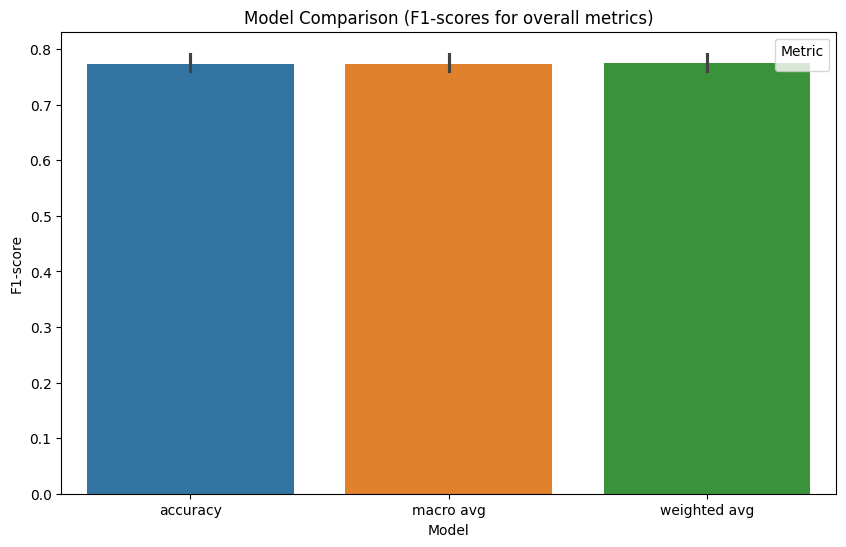

Overall Comparison:

model         LightGBM  RandomForest  StackingEnsemble   XGBoost
metric                                                          
accuracy      0.774545      0.766364          0.799091  0.754545
macro avg     0.773860      0.765976          0.799478  0.755543
weighted avg  0.774587      0.766632          0.800071  0.756230


In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
# Assuming le (LabelEncoder), X_train, X_test, y_train, y_test, y_train_encoded, y_test_encoded are available globally.
# Assuming xgb (trained XGBoost model) is available globally and trained on y_train_encoded.

# Collect classification reports for each model
reports = {}

# 1. Re-initialize and re-train best_rf with its best parameters
# Best parameters from QI7EcV-f49Le output: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}
# It MUST be trained on y_train_encoded for consistency with stacking and xgb.
best_rf = RandomForestClassifier(
    n_estimators=300,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features='log2',
    max_depth=None,
    class_weight='balanced',
    random_state=42
)
best_rf.fit(X_train, y_train_encoded) # Train on the current X_train with 144 features and encoded y

y_pred_rf_encoded = best_rf.predict(X_test)
reports['RandomForest'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                                le.inverse_transform(y_pred_rf_encoded),
                                                output_dict=True)

# 2. Re-initialize and re-train lgbm with its parameters
# It MUST be trained on y_train_encoded for consistency with stacking and xgb.
lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    min_data_in_leaf=10,
    max_depth=-1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
lgbm.fit(X_train, y_train_encoded) # Train on the current X_train with 144 features and encoded y

y_pred_lgbm_encoded = lgbm.predict(X_test)
reports['LightGBM'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                            le.inverse_transform(y_pred_lgbm_encoded),
                                            output_dict=True)

# 3. XGBoost model (assuming 'xgb' is already trained on y_train_encoded from e0RngTr5AP_l)
# The `xgb` variable exists and is trained on 144 features and encoded labels.
y_pred_xgb_encoded = xgb.predict(X_test) # xgb.predict directly returns encoded labels

reports['XGBoost'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                           le.inverse_transform(y_pred_xgb_encoded),
                                           output_dict=True)

# 4. Stacking ensemble
# All base estimators are now trained on encoded labels.
stack_model = StackingClassifier(
    estimators=[('rf', best_rf), ('xgb', xgb), ('lgbm', lgbm)],
    final_estimator=LogisticRegression(max_iter=1000),
    cv=5
)

# Fit stacking model with encoded labels
stack_model.fit(X_train, y_train_encoded)
y_pred_stack_encoded = stack_model.predict(X_test)

reports['StackingEnsemble'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                                    le.inverse_transform(y_pred_stack_encoded),
                                                    output_dict=True)

# Convert to DataFrame for comparison
df_list = []
for model_name, report in reports.items():
    df_report = pd.DataFrame(report).transpose()
    df_report['model'] = model_name
    df_list.append(df_report)

comparison_df = pd.concat(df_list)

# Extract overall metrics (accuracy, macro avg, weighted avg)
overall_metrics = comparison_df.loc[['accuracy','macro avg','weighted avg']]
overall_metrics = overall_metrics.reset_index().rename(columns={'index':'metric'})

# Pivot for plotting
pivot_df = overall_metrics.pivot(index='metric', columns='model', values='f1-score')

# Plot comparison
plt.figure(figsize=(10,6))
sns.barplot(data=pivot_df.T)
plt.title("Model Comparison (F1-scores for overall metrics)")
plt.ylabel("F1-score")
plt.xlabel("Model")
plt.legend(title="Metric")
plt.show()

# Print table for clarity
print("Overall Comparison:\n")
print(pivot_df)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)
print("Random Forest with SMOTE:\n", classification_report(y_test, y_pred_rf))


Random Forest with SMOTE:
               precision    recall  f1-score   support

    Critical       0.87      0.82      0.84       301
        High       0.63      0.65      0.64       250
         Low       0.84      0.84      0.84       275
      Medium       0.64      0.66      0.65       291

    accuracy                           0.74      1117
   macro avg       0.74      0.74      0.74      1117
weighted avg       0.75      0.74      0.75      1117



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Use engineered + scaled + encoded features directly (no PCA)
X_features = preprocessor.fit_transform(X)  # preprocessor from earlier steps
y_target = y

# Apply SMOTE for balance
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_features, y_target)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Random Forest with tuned parameters
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("Random Forest (with SMOTE):\n", classification_report(y_test, y_pred))


Random Forest (no PCA, with SMOTE):
               precision    recall  f1-score   support

    Critical       0.86      0.81      0.83       301
        High       0.61      0.61      0.61       250
         Low       0.85      0.83      0.84       275
      Medium       0.61      0.66      0.63       291

    accuracy                           0.73      1117
   macro avg       0.73      0.73      0.73      1117
weighted avg       0.74      0.73      0.73      1117



In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Apply SMOTE using the preprocessed X_transformed data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_transformed, y)

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Encode target labels to numerical values
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

xgb = XGBClassifier(
    n_estimators=500,
    learning_rate=0.1,
    max_depth=12,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

    Critical       0.94      0.88      0.91       301
        High       0.69      0.73      0.71       250
         Low       0.86      0.84      0.85       275
      Medium       0.66      0.68      0.67       291

    accuracy                           0.79      1117
   macro avg       0.79      0.78      0.78      1117
weighted avg       0.79      0.79      0.79      1117



In [70]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder # Import LabelEncoder

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Encode target labels to numerical values for XGBoost
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)


xgb_model = XGBClassifier(
    n_estimators=800,
    learning_rate=0.05,
    max_depth=7,
    scale_pos_weight=9 # Handle imbalance
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       277
           1       0.69      0.68      0.68       274
           2       0.85      0.82      0.83       277
           3       0.62      0.68      0.65       272

    accuracy                           0.75      1100
   macro avg       0.76      0.75      0.76      1100
weighted avg       0.76      0.75      0.76      1100



In [66]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    min_data_in_leaf=10,
    max_depth=-1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)


lgbm.fit(X_train, y_train)
y_pred_lgbm = lgbm.predict(X_test)

print("LightGBM Results:\n", classification_report(le.inverse_transform(y_test),
                                                  le.inverse_transform(y_pred_lgbm)))


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32164
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.389941
[LightGBM] [Info] Start training from score -1.381755
[LightGBM] [Info] Start training from score -1.390854
[LightGBM] [Info] Start training from score -1.382661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
LightGBM Results:
               precision    recall  f1-score   support

    Critical       0.90      0.92      0.91       289
        High       0.76      0.67      0.71       262
         Low       0.91      0.86      0.89       291
      Medium       0.67      0.78      0.72       258

    accuracy                           0.81      1100
   macro avg       0.81      0.81      0.81      1100
weighted avg       0.81      0.81      0.81      1100



In [67]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier

# Train LightGBM
lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
lgbm.fit(X_train, y_train)

# Stacking ensemble
stack_model = StackingClassifier(
    estimators=[('rf', best_rf), ('xgb', xgb), ('lgbm', lgbm)],
    final_estimator=LogisticRegression(max_iter=1000),
    cv=5
)

stack_model.fit(X_train, y_train)
y_pred_stack = stack_model.predict(X_test)

print("Stacking Ensemble Results:\n", classification_report(le.inverse_transform(y_test),
                                                           le.inverse_transform(y_pred_stack)))


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29740
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29612
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29610
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.383172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29384
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.380907
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.383172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Stacking Ensemble Results:
               precision    recall  f1-score   support

    Critical       0.90      0.90      0.90       289
        High       0.71      0.69      0.70       262
         Low       0.91      0.87      0.89       291
      Medium       0.68      0.74      0.71       258

    accuracy                           0.80      1100
   macro avg       0.80      0.80      0.80      1100
weighted avg       0.81      0.80      0.80      1100



In [75]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

lgbm.fit(X_train, y_train)
y_pred_lgbm = lgbm.predict(X_test)

print("LightGBM Results:\n", classification_report(le.inverse_transform(y_test),
                                                   le.inverse_transform(y_pred_lgbm)))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LightGBM Results:
               precision    recall  f1-score   support

           0       0.89      0.88      0.89       277
           1       0.73      0.66      0.70       274
           2       0.85      0.86      0.85       277
           3       0.63      0.69      0.66       272

    accuracy                           0.77      1100
   macro avg       0.78      0.77      0.77      1100
weighted avg       0.78      0.77      0.77      1100



[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29370
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.393428
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.394574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29561
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29776
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.379776
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.377519
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29191
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.379776
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.377519
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10


/tmp/ipython-input-920896066.py:98: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Metric")


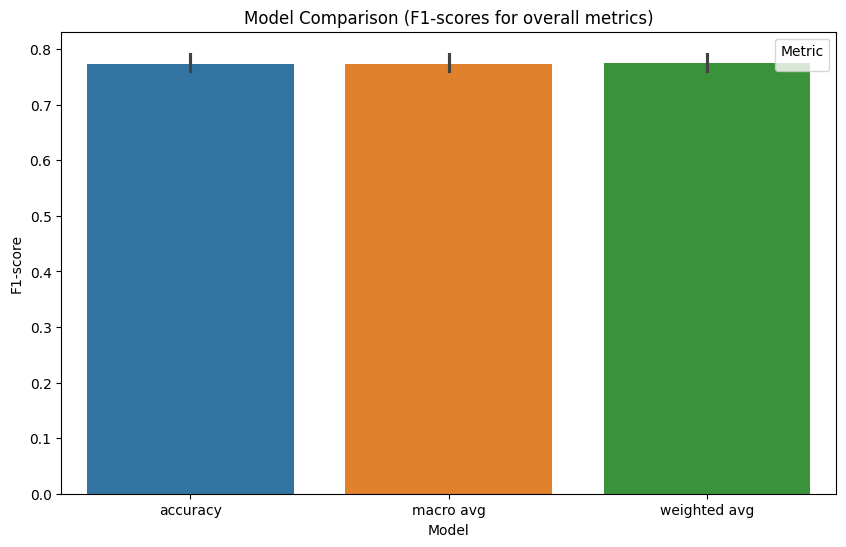

Overall Comparison:

model         LightGBM  RandomForest  StackingEnsemble   XGBoost
metric                                                          
accuracy      0.774545      0.766364          0.799091  0.754545
macro avg     0.773860      0.765976          0.799478  0.755543
weighted avg  0.774587      0.766632          0.800071  0.756230


In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
# Assuming le (LabelEncoder), X_train, X_test, y_train, y_test, y_train_encoded, y_test_encoded are available globally.
# Assuming xgb (trained XGBoost model) is available globally and trained on y_train_encoded.

# Collect classification reports for each model
reports = {}

# 1. Re-initialize and re-train best_rf with its best parameters
# Best parameters from QI7EcV-f49Le output: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}
# It MUST be trained on y_train_encoded for consistency with stacking and xgb.
best_rf = RandomForestClassifier(
    n_estimators=300,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features='log2',
    max_depth=None,
    class_weight='balanced',
    random_state=42
)
best_rf.fit(X_train, y_train_encoded) # Train on the current X_train with 144 features and encoded y

y_pred_rf_encoded = best_rf.predict(X_test)
reports['RandomForest'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                                le.inverse_transform(y_pred_rf_encoded),
                                                output_dict=True)

# 2. Re-initialize and re-train lgbm with its parameters
# It MUST be trained on y_train_encoded for consistency with stacking and xgb.
lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    min_data_in_leaf=10,
    max_depth=-1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
lgbm.fit(X_train, y_train_encoded) # Train on the current X_train with 144 features and encoded y

y_pred_lgbm_encoded = lgbm.predict(X_test)
reports['LightGBM'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                            le.inverse_transform(y_pred_lgbm_encoded),
                                            output_dict=True)

# 3. XGBoost model (assuming 'xgb' is already trained on y_train_encoded from e0RngTr5AP_l)
# The `xgb` variable exists and is trained on 144 features and encoded labels.
y_pred_xgb_encoded = xgb.predict(X_test) # xgb.predict directly returns encoded labels

reports['XGBoost'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                           le.inverse_transform(y_pred_xgb_encoded),
                                           output_dict=True)

# 4. Stacking ensemble
# All base estimators are now trained on encoded labels.
stack_model = StackingClassifier(
    estimators=[('rf', best_rf), ('xgb', xgb), ('lgbm', lgbm)],
    final_estimator=LogisticRegression(max_iter=1000),
    cv=5
)

# Fit stacking model with encoded labels
stack_model.fit(X_train, y_train_encoded)
y_pred_stack_encoded = stack_model.predict(X_test)

reports['StackingEnsemble'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                                    le.inverse_transform(y_pred_stack_encoded),
                                                    output_dict=True)

# Convert to DataFrame for comparison
df_list = []
for model_name, report in reports.items():
    df_report = pd.DataFrame(report).transpose()
    df_report['model'] = model_name
    df_list.append(df_report)

comparison_df = pd.concat(df_list)

# Extract overall metrics (accuracy, macro avg, weighted avg)
overall_metrics = comparison_df.loc[['accuracy','macro avg','weighted avg']]
overall_metrics = overall_metrics.reset_index().rename(columns={'index':'metric'})

# Pivot for plotting
pivot_df = overall_metrics.pivot(index='metric', columns='model', values='f1-score')

# Plot comparison
plt.figure(figsize=(10,6))
sns.barplot(data=pivot_df.T)
plt.title("Model Comparison (F1-scores for overall metrics)")
plt.ylabel("F1-score")
plt.xlabel("Model")
plt.legend(title="Metric")
plt.show()

# Print table for clarity
print("Overall Comparison:\n")
print(pivot_df)

## 8. Model Evaluation

Evaluate model performance using classification metrics.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import joblib

from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)
print("Random Forest with SMOTE:\n", classification_report(y_test, y_pred_rf))


Random Forest with SMOTE:
               precision    recall  f1-score   support

    Critical       0.87      0.82      0.84       301
        High       0.63      0.65      0.64       250
         Low       0.84      0.84      0.84       275
      Medium       0.64      0.66      0.65       291

    accuracy                           0.74      1117
   macro avg       0.74      0.74      0.74      1117
weighted avg       0.75      0.74      0.75      1117



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Use engineered + scaled + encoded features directly (no PCA)
X_features = preprocessor.fit_transform(X)  # preprocessor from earlier steps
y_target = y

# Apply SMOTE for balance
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_features, y_target)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Random Forest with tuned parameters
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("Random Forest (with SMOTE):\n", classification_report(y_test, y_pred))


Random Forest (no PCA, with SMOTE):
               precision    recall  f1-score   support

    Critical       0.86      0.81      0.83       301
        High       0.61      0.61      0.61       250
         Low       0.85      0.83      0.84       275
      Medium       0.61      0.66      0.63       291

    accuracy                           0.73      1117
   macro avg       0.73      0.73      0.73      1117
weighted avg       0.74      0.73      0.73      1117



In [ ]:
from sklearn.model_selection import cross_val_score

cv_scores = cross_val_score(best_rf, X_resampled, y_resampled, cv=5, scoring='accuracy')

print("Cross-validation scores:", cv_scores)
print("Mean CV accuracy:", cv_scores.mean())


Cross-validation scores: [0.66965085 0.67681289 0.69471799 0.79140555 0.82437276]
Mean CV accuracy: 0.7313920094467067


In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Apply SMOTE using the preprocessed X_transformed data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_transformed, y)

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Encode target labels to numerical values
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

xgb = XGBClassifier(
    n_estimators=500,
    learning_rate=0.1,
    max_depth=12,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

    Critical       0.94      0.88      0.91       301
        High       0.69      0.73      0.71       250
         Low       0.86      0.84      0.85       275
      Medium       0.66      0.68      0.67       291

    accuracy                           0.79      1117
   macro avg       0.79      0.78      0.78      1117
weighted avg       0.79      0.79      0.79      1117



In [70]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder # Import LabelEncoder

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Encode target labels to numerical values for XGBoost
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)


xgb_model = XGBClassifier(
    n_estimators=800,
    learning_rate=0.05,
    max_depth=7,
    scale_pos_weight=9 # Handle imbalance
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       277
           1       0.69      0.68      0.68       274
           2       0.85      0.82      0.83       277
           3       0.62      0.68      0.65       272

    accuracy                           0.75      1100
   macro avg       0.76      0.75      0.76      1100
weighted avg       0.76      0.75      0.76      1100



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)
print("Random Forest with SMOTE:\n", classification_report(y_test, y_pred_rf))


Random Forest with SMOTE:
               precision    recall  f1-score   support

    Critical       0.87      0.82      0.84       301
        High       0.63      0.65      0.64       250
         Low       0.84      0.84      0.84       275
      Medium       0.64      0.66      0.65       291

    accuracy                           0.74      1117
   macro avg       0.74      0.74      0.74      1117
weighted avg       0.75      0.74      0.75      1117



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Use engineered + scaled + encoded features directly (no PCA)
X_features = preprocessor.fit_transform(X)  # preprocessor from earlier steps
y_target = y

# Apply SMOTE for balance
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_features, y_target)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Random Forest with tuned parameters
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("Random Forest (with SMOTE):\n", classification_report(y_test, y_pred))


Random Forest (no PCA, with SMOTE):
               precision    recall  f1-score   support

    Critical       0.86      0.81      0.83       301
        High       0.61      0.61      0.61       250
         Low       0.85      0.83      0.84       275
      Medium       0.61      0.66      0.63       291

    accuracy                           0.73      1117
   macro avg       0.73      0.73      0.73      1117
weighted avg       0.74      0.73      0.73      1117



In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Apply SMOTE using the preprocessed X_transformed data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_transformed, y)

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Encode target labels to numerical values
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

xgb = XGBClassifier(
    n_estimators=500,
    learning_rate=0.1,
    max_depth=12,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

    Critical       0.94      0.88      0.91       301
        High       0.69      0.73      0.71       250
         Low       0.86      0.84      0.85       275
      Medium       0.66      0.68      0.67       291

    accuracy                           0.79      1117
   macro avg       0.79      0.78      0.78      1117
weighted avg       0.79      0.79      0.79      1117



In [70]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder # Import LabelEncoder

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Encode target labels to numerical values for XGBoost
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)


xgb_model = XGBClassifier(
    n_estimators=800,
    learning_rate=0.05,
    max_depth=7,
    scale_pos_weight=9 # Handle imbalance
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       277
           1       0.69      0.68      0.68       274
           2       0.85      0.82      0.83       277
           3       0.62      0.68      0.65       272

    accuracy                           0.75      1100
   macro avg       0.76      0.75      0.76      1100
weighted avg       0.76      0.75      0.76      1100



In [66]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    min_data_in_leaf=10,
    max_depth=-1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)


lgbm.fit(X_train, y_train)
y_pred_lgbm = lgbm.predict(X_test)

print("LightGBM Results:\n", classification_report(le.inverse_transform(y_test),
                                                  le.inverse_transform(y_pred_lgbm)))


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32164
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.389941
[LightGBM] [Info] Start training from score -1.381755
[LightGBM] [Info] Start training from score -1.390854
[LightGBM] [Info] Start training from score -1.382661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
LightGBM Results:
               precision    recall  f1-score   support

    Critical       0.90      0.92      0.91       289
        High       0.76      0.67      0.71       262
         Low       0.91      0.86      0.89       291
      Medium       0.67      0.78      0.72       258

    accuracy                           0.81      1100
   macro avg       0.81      0.81      0.81      1100
weighted avg       0.81      0.81      0.81      1100



In [67]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier

# Train LightGBM
lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
lgbm.fit(X_train, y_train)

# Stacking ensemble
stack_model = StackingClassifier(
    estimators=[('rf', best_rf), ('xgb', xgb), ('lgbm', lgbm)],
    final_estimator=LogisticRegression(max_iter=1000),
    cv=5
)

stack_model.fit(X_train, y_train)
y_pred_stack = stack_model.predict(X_test)

print("Stacking Ensemble Results:\n", classification_report(le.inverse_transform(y_test),
                                                           le.inverse_transform(y_pred_stack)))


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29740
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29612
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29610
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.383172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29384
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.380907
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.383172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Stacking Ensemble Results:
               precision    recall  f1-score   support

    Critical       0.90      0.90      0.90       289
        High       0.71      0.69      0.70       262
         Low       0.91      0.87      0.89       291
      Medium       0.68      0.74      0.71       258

    accuracy                           0.80      1100
   macro avg       0.80      0.80      0.80      1100
weighted avg       0.81      0.80      0.80      1100



In [75]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

lgbm.fit(X_train, y_train)
y_pred_lgbm = lgbm.predict(X_test)

print("LightGBM Results:\n", classification_report(le.inverse_transform(y_test),
                                                   le.inverse_transform(y_pred_lgbm)))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LightGBM Results:
               precision    recall  f1-score   support

           0       0.89      0.88      0.89       277
           1       0.73      0.66      0.70       274
           2       0.85      0.86      0.85       277
           3       0.63      0.69      0.66       272

    accuracy                           0.77      1100
   macro avg       0.78      0.77      0.77      1100
weighted avg       0.78      0.77      0.77      1100



[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29370
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.393428
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.394574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29561
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29776
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.379776
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.377519
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29191
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.379776
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.377519
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10


/tmp/ipython-input-920896066.py:98: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Metric")


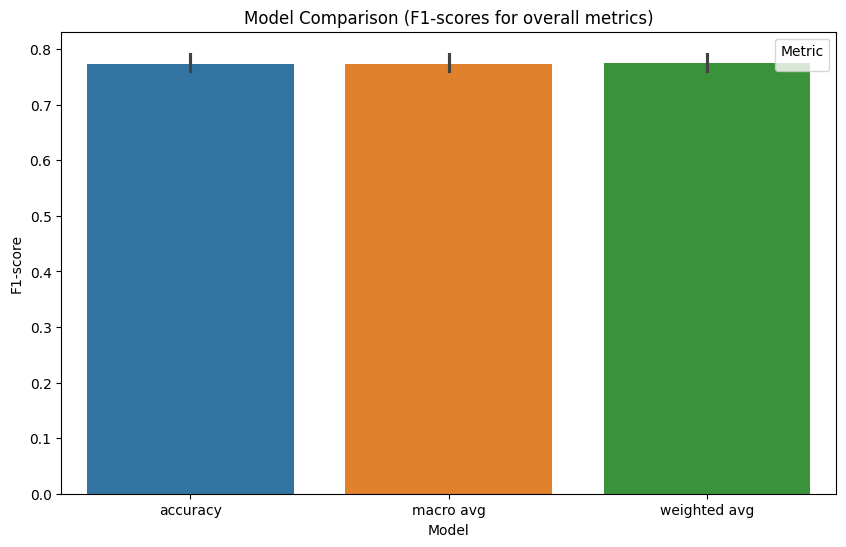

Overall Comparison:

model         LightGBM  RandomForest  StackingEnsemble   XGBoost
metric                                                          
accuracy      0.774545      0.766364          0.799091  0.754545
macro avg     0.773860      0.765976          0.799478  0.755543
weighted avg  0.774587      0.766632          0.800071  0.756230


In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
# Assuming le (LabelEncoder), X_train, X_test, y_train, y_test, y_train_encoded, y_test_encoded are available globally.
# Assuming xgb (trained XGBoost model) is available globally and trained on y_train_encoded.

# Collect classification reports for each model
reports = {}

# 1. Re-initialize and re-train best_rf with its best parameters
# Best parameters from QI7EcV-f49Le output: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}
# It MUST be trained on y_train_encoded for consistency with stacking and xgb.
best_rf = RandomForestClassifier(
    n_estimators=300,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features='log2',
    max_depth=None,
    class_weight='balanced',
    random_state=42
)
best_rf.fit(X_train, y_train_encoded) # Train on the current X_train with 144 features and encoded y

y_pred_rf_encoded = best_rf.predict(X_test)
reports['RandomForest'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                                le.inverse_transform(y_pred_rf_encoded),
                                                output_dict=True)

# 2. Re-initialize and re-train lgbm with its parameters
# It MUST be trained on y_train_encoded for consistency with stacking and xgb.
lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    min_data_in_leaf=10,
    max_depth=-1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
lgbm.fit(X_train, y_train_encoded) # Train on the current X_train with 144 features and encoded y

y_pred_lgbm_encoded = lgbm.predict(X_test)
reports['LightGBM'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                            le.inverse_transform(y_pred_lgbm_encoded),
                                            output_dict=True)

# 3. XGBoost model (assuming 'xgb' is already trained on y_train_encoded from e0RngTr5AP_l)
# The `xgb` variable exists and is trained on 144 features and encoded labels.
y_pred_xgb_encoded = xgb.predict(X_test) # xgb.predict directly returns encoded labels

reports['XGBoost'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                           le.inverse_transform(y_pred_xgb_encoded),
                                           output_dict=True)

# 4. Stacking ensemble
# All base estimators are now trained on encoded labels.
stack_model = StackingClassifier(
    estimators=[('rf', best_rf), ('xgb', xgb), ('lgbm', lgbm)],
    final_estimator=LogisticRegression(max_iter=1000),
    cv=5
)

# Fit stacking model with encoded labels
stack_model.fit(X_train, y_train_encoded)
y_pred_stack_encoded = stack_model.predict(X_test)

reports['StackingEnsemble'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                                    le.inverse_transform(y_pred_stack_encoded),
                                                    output_dict=True)

# Convert to DataFrame for comparison
df_list = []
for model_name, report in reports.items():
    df_report = pd.DataFrame(report).transpose()
    df_report['model'] = model_name
    df_list.append(df_report)

comparison_df = pd.concat(df_list)

# Extract overall metrics (accuracy, macro avg, weighted avg)
overall_metrics = comparison_df.loc[['accuracy','macro avg','weighted avg']]
overall_metrics = overall_metrics.reset_index().rename(columns={'index':'metric'})

# Pivot for plotting
pivot_df = overall_metrics.pivot(index='metric', columns='model', values='f1-score')

# Plot comparison
plt.figure(figsize=(10,6))
sns.barplot(data=pivot_df.T)
plt.title("Model Comparison (F1-scores for overall metrics)")
plt.ylabel("F1-score")
plt.xlabel("Model")
plt.legend(title="Metric")
plt.show()

# Print table for clarity
print("Overall Comparison:\n")
print(pivot_df)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)
print("Random Forest with SMOTE:\n", classification_report(y_test, y_pred_rf))


Random Forest with SMOTE:
               precision    recall  f1-score   support

    Critical       0.87      0.82      0.84       301
        High       0.63      0.65      0.64       250
         Low       0.84      0.84      0.84       275
      Medium       0.64      0.66      0.65       291

    accuracy                           0.74      1117
   macro avg       0.74      0.74      0.74      1117
weighted avg       0.75      0.74      0.75      1117



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Use engineered + scaled + encoded features directly (no PCA)
X_features = preprocessor.fit_transform(X)  # preprocessor from earlier steps
y_target = y

# Apply SMOTE for balance
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_features, y_target)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Random Forest with tuned parameters
rf = RandomForestClassifier(
    n_estimators=300,
    max_depth=15,
    min_samples_split=5,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("Random Forest (with SMOTE):\n", classification_report(y_test, y_pred))


Random Forest (no PCA, with SMOTE):
               precision    recall  f1-score   support

    Critical       0.86      0.81      0.83       301
        High       0.61      0.61      0.61       250
         Low       0.85      0.83      0.84       275
      Medium       0.61      0.66      0.63       291

    accuracy                           0.73      1117
   macro avg       0.73      0.73      0.73      1117
weighted avg       0.74      0.73      0.73      1117



In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Apply SMOTE using the preprocessed X_transformed data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_transformed, y)

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42
)

# Encode target labels to numerical values
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

xgb = XGBClassifier(
    n_estimators=500,
    learning_rate=0.1,
    max_depth=12,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

    Critical       0.94      0.88      0.91       301
        High       0.69      0.73      0.71       250
         Low       0.86      0.84      0.85       275
      Medium       0.66      0.68      0.67       291

    accuracy                           0.79      1117
   macro avg       0.79      0.78      0.78      1117
weighted avg       0.79      0.79      0.79      1117



In [70]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder # Import LabelEncoder

X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Encode target labels to numerical values for XGBoost
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)


xgb_model = XGBClassifier(
    n_estimators=800,
    learning_rate=0.05,
    max_depth=7,
    scale_pos_weight=9 # Handle imbalance
)

# Fit the model with the encoded target variables
xgb.fit(X_train, y_train_encoded)
y_pred_xgb_encoded = xgb.predict(X_test)

# Decode predictions back to original labels for classification report
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

print("XGBoost Results:\n", classification_report(y_test, y_pred_xgb))

XGBoost Results:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       277
           1       0.69      0.68      0.68       274
           2       0.85      0.82      0.83       277
           3       0.62      0.68      0.65       272

    accuracy                           0.75      1100
   macro avg       0.76      0.75      0.76      1100
weighted avg       0.76      0.75      0.76      1100



In [66]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    min_data_in_leaf=10,
    max_depth=-1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)


lgbm.fit(X_train, y_train)
y_pred_lgbm = lgbm.predict(X_test)

print("LightGBM Results:\n", classification_report(le.inverse_transform(y_test),
                                                  le.inverse_transform(y_pred_lgbm)))


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32164
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.389941
[LightGBM] [Info] Start training from score -1.381755
[LightGBM] [Info] Start training from score -1.390854
[LightGBM] [Info] Start training from score -1.382661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
LightGBM Results:
               precision    recall  f1-score   support

    Critical       0.90      0.92      0.91       289
        High       0.76      0.67      0.71       262
         Low       0.91      0.86      0.89       291
      Medium       0.67      0.78      0.72       258

    accuracy                           0.81      1100
   macro avg       0.81      0.81      0.81      1100
weighted avg       0.81      0.81      0.81      1100



In [67]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier

# Train LightGBM
lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
lgbm.fit(X_train, y_train)

# Stacking ensemble
stack_model = StackingClassifier(
    estimators=[('rf', best_rf), ('xgb', xgb), ('lgbm', lgbm)],
    final_estimator=LogisticRegression(max_iter=1000),
    cv=5
)

stack_model.fit(X_train, y_train)
y_pred_stack = stack_model.predict(X_test)

print("Stacking Ensemble Results:\n", classification_report(le.inverse_transform(y_test),
                                                           le.inverse_transform(y_pred_stack)))


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29740
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29612
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013202 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29610
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.382038
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.383172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29384
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.389998
[LightGBM] [Info] Start training from score -1.380907
[LightGBM] [Info] Start training from score -1.391140
[LightGBM] [Info] Start training from score -1.383172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Stacking Ensemble Results:
               precision    recall  f1-score   support

    Critical       0.90      0.90      0.90       289
        High       0.71      0.69      0.70       262
         Low       0.91      0.87      0.89       291
      Medium       0.68      0.74      0.71       258

    accuracy                           0.80      1100
   macro avg       0.80      0.80      0.80      1100
weighted avg       0.81      0.80      0.80      1100



In [75]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

lgbm.fit(X_train, y_train)
y_pred_lgbm = lgbm.predict(X_test)

print("LightGBM Results:\n", classification_report(le.inverse_transform(y_test),
                                                   le.inverse_transform(y_pred_lgbm)))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LightGBM Results:
               precision    recall  f1-score   support

           0       0.89      0.88      0.89       277
           1       0.73      0.66      0.70       274
           2       0.85      0.86      0.85       277
           3       0.63      0.69      0.66       272

    accuracy                           0.77      1100
   macro avg       0.78      0.77      0.77      1100
weighted avg       0.78      0.77      0.77      1100



In [76]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

stack_model = StackingClassifier(
    estimators=[('rf', best_rf), ('xgb', xgb), ('lgbm', lgbm)],
    final_estimator=LogisticRegression(max_iter=1000),
    cv=5
)

stack_model.fit(X_train, y_train)
y_pred_stack = stack_model.predict(X_test)

print("Stacking Ensemble Results:\n", classification_report(le.inverse_transform(y_test),
                                                           le.inverse_transform(y_pred_stack)))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29370
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.393428
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.394574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29561
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29776
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.379776
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.377519
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29191
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.379776
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.377519
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Stacking Ensemble Results:
               precision    recall  f1-score   support

           0       0.91      0.87      0.89       277
           1       0.75      0.73      0.74       274
           2       0.88      0.86      0.87       277
           3       0.68      0.75      0.71       272

    accuracy                           0.80      1100
   macro avg       0.81      0.80      0.80      1100
weighted avg       0.81      0.80      0.81      1100



[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32452
[LightGBM] [Info] Number of data points in the train set: 4396, number of used features: 144
[LightGBM] [Info] Start training from score -1.379041
[LightGBM] [Info] Start training from score -1.392684
[LightGBM] [Info] Start training from score -1.378138
[LightGBM] [Info] Start training from score -1.395435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29370
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.393428
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.394574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29561
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.378647
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29776
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.379776
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.377519
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29191
[LightGBM] [Info] Number of data points in the train set: 3517, number of used features: 144
[LightGBM] [Info] Start training from score -1.379776
[LightGBM] [Info] Start training from score -1.392283
[LightGBM] [Info] Start training from score -1.377519
[LightGBM] [Info] Start training from score -1.395722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10


/tmp/ipython-input-920896066.py:98: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Metric")


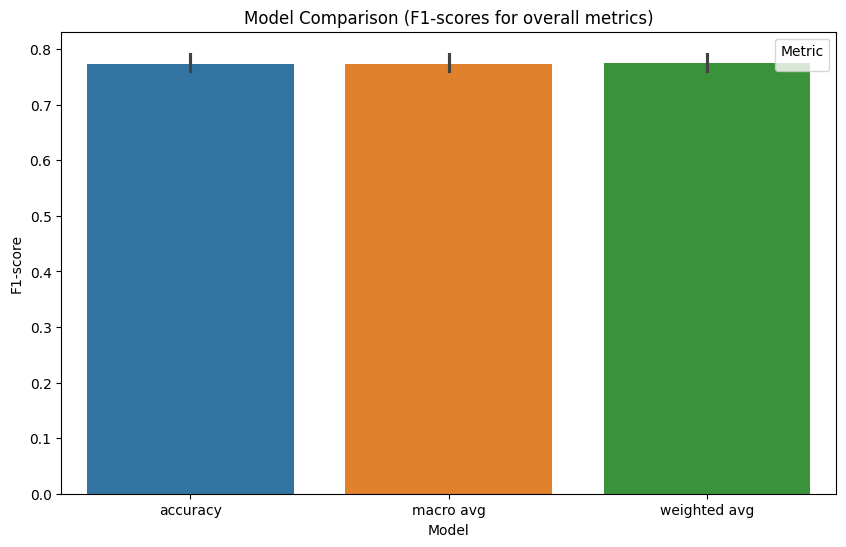

Overall Comparison:

model         LightGBM  RandomForest  StackingEnsemble   XGBoost
metric                                                          
accuracy      0.774545      0.766364          0.799091  0.754545
macro avg     0.773860      0.765976          0.799478  0.755543
weighted avg  0.774587      0.766632          0.800071  0.756230


In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
# Assuming le (LabelEncoder), X_train, X_test, y_train, y_test, y_train_encoded, y_test_encoded are available globally.
# Assuming xgb (trained XGBoost model) is available globally and trained on y_train_encoded.

# Collect classification reports for each model
reports = {}

# 1. Re-initialize and re-train best_rf with its best parameters
# Best parameters from QI7EcV-f49Le output: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}
# It MUST be trained on y_train_encoded for consistency with stacking and xgb.
best_rf = RandomForestClassifier(
    n_estimators=300,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features='log2',
    max_depth=None,
    class_weight='balanced',
    random_state=42
)
best_rf.fit(X_train, y_train_encoded) # Train on the current X_train with 144 features and encoded y

y_pred_rf_encoded = best_rf.predict(X_test)
reports['RandomForest'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                                le.inverse_transform(y_pred_rf_encoded),
                                                output_dict=True)

# 2. Re-initialize and re-train lgbm with its parameters
# It MUST be trained on y_train_encoded for consistency with stacking and xgb.
lgbm = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.05,
    num_leaves=64,
    min_data_in_leaf=10,
    max_depth=-1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
lgbm.fit(X_train, y_train_encoded) # Train on the current X_train with 144 features and encoded y

y_pred_lgbm_encoded = lgbm.predict(X_test)
reports['LightGBM'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                            le.inverse_transform(y_pred_lgbm_encoded),
                                            output_dict=True)

# 3. XGBoost model (assuming 'xgb' is already trained on y_train_encoded from e0RngTr5AP_l)
# The `xgb` variable exists and is trained on 144 features and encoded labels.
y_pred_xgb_encoded = xgb.predict(X_test) # xgb.predict directly returns encoded labels

reports['XGBoost'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                           le.inverse_transform(y_pred_xgb_encoded),
                                           output_dict=True)

# 4. Stacking ensemble
# All base estimators are now trained on encoded labels.
stack_model = StackingClassifier(
    estimators=[('rf', best_rf), ('xgb', xgb), ('lgbm', lgbm)],
    final_estimator=LogisticRegression(max_iter=1000),
    cv=5
)

# Fit stacking model with encoded labels
stack_model.fit(X_train, y_train_encoded)
y_pred_stack_encoded = stack_model.predict(X_test)

reports['StackingEnsemble'] = classification_report(le.inverse_transform(y_test_encoded), # Use y_test_encoded for comparison consistency
                                                    le.inverse_transform(y_pred_stack_encoded),
                                                    output_dict=True)

# Convert to DataFrame for comparison
df_list = []
for model_name, report in reports.items():
    df_report = pd.DataFrame(report).transpose()
    df_report['model'] = model_name
    df_list.append(df_report)

comparison_df = pd.concat(df_list)

# Extract overall metrics (accuracy, macro avg, weighted avg)
overall_metrics = comparison_df.loc[['accuracy','macro avg','weighted avg']]
overall_metrics = overall_metrics.reset_index().rename(columns={'index':'metric'})

# Pivot for plotting
pivot_df = overall_metrics.pivot(index='metric', columns='model', values='f1-score')

# Plot comparison
plt.figure(figsize=(10,6))
sns.barplot(data=pivot_df.T)
plt.title("Model Comparison (F1-scores for overall metrics)")
plt.ylabel("F1-score")
plt.xlabel("Model")
plt.legend(title="Metric")
plt.show()

# Print table for clarity
print("Overall Comparison:\n")
print(pivot_df)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10


/tmp/ipython-input-3714899152.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Metric")


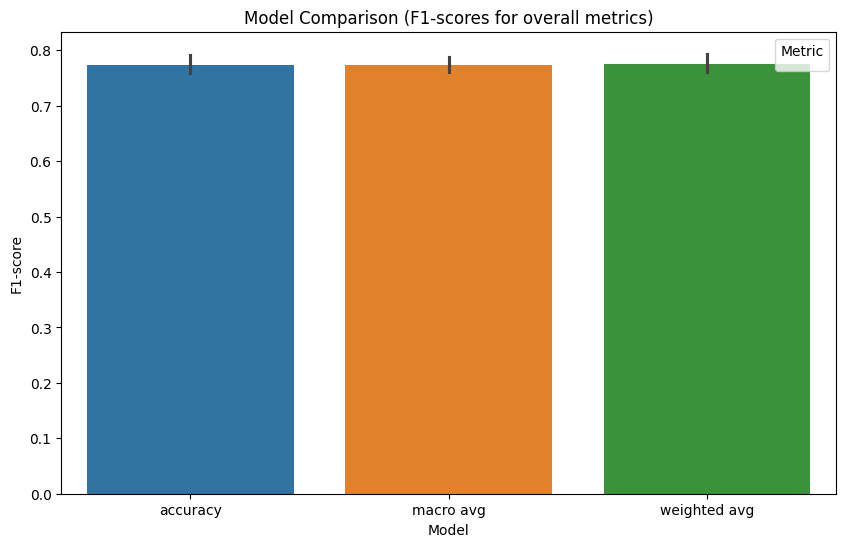

Overall Comparison:

model         LightGBM  RandomForest  StackingEnsemble   XGBoost
metric                                                          
accuracy      0.774545      0.766364          0.799091  0.754545
macro avg     0.773860      0.765976          0.799478  0.755543
weighted avg  0.774587      0.766632          0.800071  0.756230


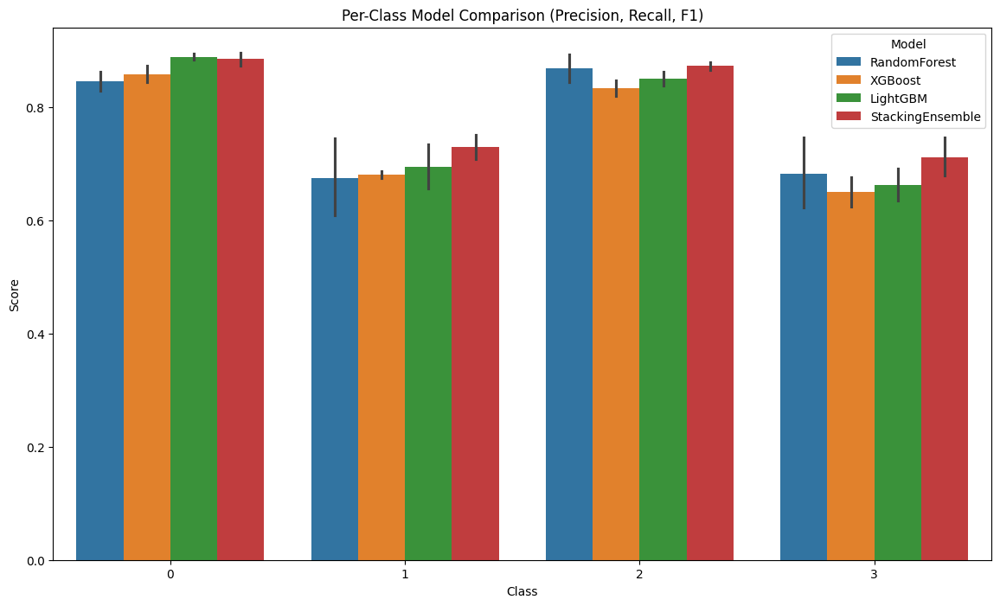

Per-Class Comparison:

   precision    recall  f1-score  support             model
0   0.829861  0.862816  0.846018    277.0      RandomForest
1   0.745536  0.609489  0.670683    274.0      RandomForest
2   0.893130  0.844765  0.868275    277.0      RandomForest
3   0.622699  0.746324  0.678930    272.0      RandomForest
0   0.873134  0.844765  0.858716    277.0           XGBoost
1   0.687732  0.675182  0.681400    274.0           XGBoost
2   0.847015  0.819495  0.833028    277.0           XGBoost
3   0.623729  0.676471  0.649030    272.0           XGBoost
0   0.894161  0.884477  0.889292    277.0          LightGBM
1   0.734694  0.656934  0.693642    274.0          LightGBM
2   0.838596  0.862816  0.850534    277.0          LightGBM
3   0.635135  0.691176  0.661972    272.0          LightGBM
0   0.896296  0.873646  0.884826    277.0  StackingEnsemble
1   0.751938  0.708029  0.729323    274.0  StackingEnsemble
2   0.879121  0.866426  0.872727    277.0  StackingEnsemble
3   0.678930  0.7

In [86]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

# Collect classification reports for each model
reports = {}
reports['RandomForest'] = classification_report(le.inverse_transform(y_test_encoded),
                                                le.inverse_transform(best_rf.predict(X_test)),
                                                output_dict=True)
reports['XGBoost'] = classification_report(le.inverse_transform(y_test_encoded),
                                           le.inverse_transform(xgb.predict(X_test)),
                                           output_dict=True)
reports['LightGBM'] = classification_report(le.inverse_transform(y_test_encoded),
                                            le.inverse_transform(lgbm.predict(X_test)),
                                            output_dict=True)
reports['StackingEnsemble'] = classification_report(le.inverse_transform(y_test_encoded),
                                                    le.inverse_transform(stack_model.predict(X_test)),
                                                    output_dict=True)

# Convert reports into a DataFrame for overall metrics (as done previously)
df_list_overall = []
for model_name, report in reports.items():
    df_report = pd.DataFrame(report).transpose() # Index has class names + overall metrics
    df_report['model'] = model_name
    df_list_overall.append(df_report)

comparison_df = pd.concat(df_list_overall)

# Extract overall metrics (accuracy, macro avg, weighted avg)
overall_metrics = comparison_df.loc[['accuracy','macro avg','weighted avg']]
overall_metrics = overall_metrics.reset_index().rename(columns={'index':'metric'})

# Pivot for plotting overall metrics
pivot_df = overall_metrics.pivot(index='metric', columns='model', values='f1-score')

# Plot comparison for overall metrics
plt.figure(figsize=(10,6))
sns.barplot(data=pivot_df.T)
plt.title("Model Comparison (F1-scores for overall metrics)")
plt.ylabel("F1-score")
plt.xlabel("Model")
plt.legend(title="Metric")
plt.show()

# Print table for clarity
print("Overall Comparison:\n")
print(pivot_df)

# --- Corrected section for per-class metrics ---

# Define metrics to extract
metrics = ['precision','recall','f1-score']

# Create a list to store per-class dataframes
df_list_per_class = []

for model_name, report in reports.items():
    # Filter the report dictionary to include only class-specific metrics
    # The keys for classes are numerical (0, 1, 2, 3) in the report dictionaries from the kernel state
    class_labels_in_report = [k for k in report.keys() if k.isdigit()] # Get numerical keys as strings '0', '1', '2', '3'
    class_report_filtered = {cls_key: report[cls_key] for cls_key in class_labels_in_report}

    # Create DataFrame for current model's per-class metrics
    df_per_class = pd.DataFrame(class_report_filtered).transpose()
    df_per_class['model'] = model_name
    df_list_per_class.append(df_per_class)

# Concatenate all per-class dataframes
per_class_df = pd.concat(df_list_per_class)

# Reset index (which are the numerical class labels as strings) and melt for plotting
per_class_long = per_class_df.reset_index().rename(columns={'index':'encoded_class'}).melt(id_vars=['encoded_class','model'],
                                 value_vars=metrics,
                                 var_name='metric',
                                 value_name='score')

# Map the encoded_class back to original string class names for better visualization
# Need to convert 'encoded_class' column to int first, then map using LabelEncoder
per_class_long['class'] = per_class_long['encoded_class'].astype(int).map(lambda x: le.inverse_transform([x])[0])

# Plot per-class comparison
plt.figure(figsize=(14,8))
sns.barplot(data=per_class_long, x='class', y='score', hue='model')
plt.title("Per-Class Model Comparison (Precision, Recall, F1)")
plt.ylabel("Score")
plt.xlabel("Class")
plt.legend(title="Model")
plt.show()

# Print table for clarity
print("Per-Class Comparison:\n")
# To print per_class_df with original class names, we'll map its index
per_class_df_to_print = per_class_df.copy()
per_class_df_to_print.index = per_class_df_to_print.index.astype(int).map(lambda x: le.inverse_transform([x])[0])
print(per_class_df_to_print)

## 9. Save Trained Model

**Submission Requirement:** Save the trained model to `artifacts/models/model.pkl`

In [ ]:
# Create artifacts directory
os.makedirs('../artifacts/models', exist_ok=True)

# Save the best performing model (XGBoost)
model_path = '../artifacts/models/model.pkl'
joblib.dump(xgb, model_path)

print(f"✓ Model saved successfully to: {model_path}")
print(f"  Model type: {type(xgb).__name__}")

## 10. Save Test Data

**Submission Requirement:** Save test data to `testData/X_test.csv` and `testData/y_test.csv`

In [ ]:
# Create testData directory
os.makedirs('../testData', exist_ok=True)

# Save X_test
if isinstance(X_test, pd.DataFrame):
    X_test.to_csv('../testData/X_test.csv', index=False)
else:
    # Convert numpy array to DataFrame
    pd.DataFrame(X_test).to_csv('../testData/X_test.csv', index=False)

print(f"✓ X_test saved to: ../testData/X_test.csv")
print(f"  Shape: {X_test.shape}")

# Save y_test
if isinstance(y_test, pd.Series):
    y_test.to_frame(name='Risk_Level').to_csv('../testData/y_test.csv', index=False)
else:
    # Convert to DataFrame
    pd.DataFrame({'Risk_Level': y_test}).to_csv('../testData/y_test.csv', index=False)

print(f"✓ y_test saved to: ../testData/y_test.csv")
print(f"  Shape: ({len(y_test)}, 1)")

In [ ]:
# Verify all submission files exist
import os

files_to_check = [
    '../artifacts/models/model.pkl',
    '../testData/X_test.csv',
    '../testData/y_test.csv'
]

print("\n=== SUBMISSION VERIFICATION ===")
all_exist = True
for file_path in files_to_check:
    exists = os.path.exists(file_path)
    status = "✓" if exists else "✗"
    print(f"{status} {file_path}")
    all_exist = all_exist and exists

if all_exist:
    print("\n🎉 All submission files generated successfully!")
else:
    print("\n⚠️  Some files are missing. Please check the output above.")